<a href="https://colab.research.google.com/github/grjadhav409/ATG4B-Cancer-Inhibitors-Prediction-using-ML/blob/main/Final_Model_ATG4B.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# lib / data / X and Y

In [ ]:
#Load libraries
import numpy as np
import pandas as pd
from numpy import arange
from matplotlib import pyplot
from pandas import read_csv
from pandas import set_option
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.metrics import mean_squared_error

In [ ]:
#load X and Y
df1= pd.read_csv("/content/drive/MyDrive/Colab Notebooks/drug discovery/ATG4B/data_atg4b/X_padel.csv")
df2= pd.read_csv("/content/drive/MyDrive/Colab Notebooks/drug discovery/ATG4B/data_atg4b/y_pic50.csv")

#combine X and Y 
df4= pd.concat([df1,df2],axis=1)

#remove unnamed column
df5 = df4.loc[:,~df4.columns.str.match("Unnamed")]

# Replace to drop rows or columns infinite values
df6 = df5.replace([np.inf, -np.inf], np.nan).dropna(axis=0)

#reset index
df7= df6.reset_index()
df7 = df7.loc[:,~df7.columns.str.match("index")]

# define X and Y
X = df7.drop("pIC50", axis=1)
X=X.astype('int')
Y= df7["pIC50"]
Y=Y.astype('float')

X

,nAcid,ALogP,ALogp2,AMR,apol,naAromAtom,nAromBond,nAtom,nHeavyAtom,nH,...,PubchemFP871,PubchemFP872,PubchemFP873,PubchemFP874,PubchemFP875,PubchemFP876,PubchemFP877,PubchemFP878,PubchemFP879,PubchemFP880
0,0,1,1,36,42,12,12,34,26,8,...,0,0,0,0,0,0,0,0,0,0
1,0,-1,2,59,60,11,11,54,26,28,...,0,0,0,0,0,0,0,0,0,0
2,0,-1,1,14,33,12,13,26,17,9,...,0,0,0,0,0,0,0,0,0,0
3,0,1,2,80,65,12,17,51,30,21,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,41,58,17,17,47,27,20,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
238,0,0,0,57,66,16,17,54,33,21,...,0,0,0,0,0,0,0,0,0,0
239,0,0,0,49,58,12,12,51,28,23,...,0,0,0,0,0,0,0,0,0,0
240,0,-1,3,44,55,12,12,48,27,21,...,0,0,0,0,0,0,0,0,0,0
241,0,-2,4,37,69,26,35,54,38,16,...,0,0,0,0,0,0,0,0,0,0


# Feature Selection

In [ ]:
# Feature Selection method 1

from sklearn.feature_selection import VarianceThreshold

sel = VarianceThreshold(threshold=(.9 * (1 - .9)))

X_features = pd.DataFrame(sel.fit_transform(X))

X_features

,0,1,2,3,4,5,6,7,8,9,...,1385,1386,1387,1388,1389,1390,1391,1392,1393,1394
0,0,1,1,36,42,12,12,34,26,8,...,0,0,0,0,0,1,1,0,0,0
1,0,-1,2,59,60,11,11,54,26,28,...,0,0,0,0,1,0,0,0,0,0
2,0,-1,1,14,33,12,13,26,17,9,...,0,0,1,0,1,1,1,1,0,0
3,0,1,2,80,65,12,17,51,30,21,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,41,58,17,17,47,27,20,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
238,0,0,0,57,66,16,17,54,33,21,...,0,1,0,0,1,1,1,1,0,1
239,0,0,0,49,58,12,12,51,28,23,...,0,0,0,0,0,0,0,0,0,0
240,0,-1,3,44,55,12,12,48,27,21,...,0,0,0,0,0,0,0,0,0,0
241,0,-2,4,37,69,26,35,54,38,16,...,1,0,1,1,0,1,0,1,1,0


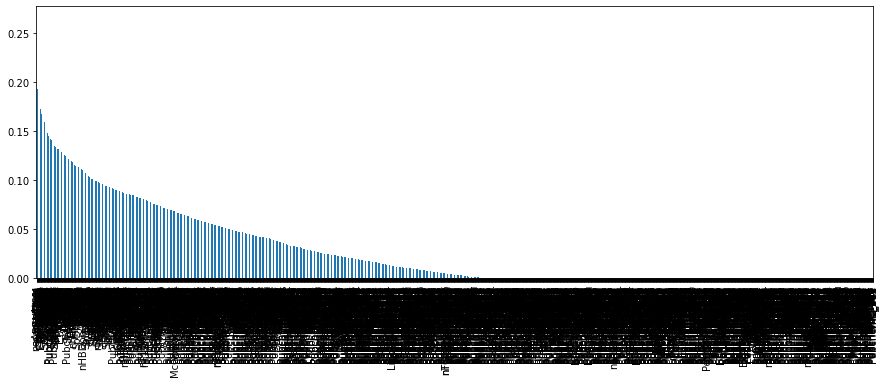

In [ ]:
# Feature Selection method 2
from sklearn.feature_selection import mutual_info_regression
# determine the mutual information
mutual_info = mutual_info_regression(X.fillna(0), Y)
mutual_info = pd.Series(mutual_info)
mutual_info.index = X.columns
mutual_info.sort_values(ascending=False)
mutual_info.sort_values(ascending=False).plot.bar(figsize=(15,5))

In [ ]:
from sklearn.feature_selection import SelectPercentile
## Selecting the top 20 percentile
selected_top_columns = SelectPercentile(mutual_info_regression, percentile=20)
selected_top_columns.fit(X.fillna(0),Y)
selected_top_columns.get_support()
columns= X.columns[selected_top_columns.get_support()]
X_features_new = X[columns].copy()
X_features_new

,ALogP,naAromAtom,nAromBond,nHeavyAtom,nC,nN,nO,nS,ATS1m,ATS2m,...,PubchemFP646,PubchemFP651,PubchemFP652,PubchemFP691,PubchemFP695,PubchemFP697,PubchemFP734,PubchemFP737,PubchemFP797,PubchemFP800
0,1,12,12,26,13,3,2,1,6695,11115,...,0,0,0,0,0,1,1,1,1,1
1,-1,11,11,26,21,4,1,0,4794,7009,...,1,0,0,0,0,1,0,0,0,0
2,-1,12,13,17,14,1,2,0,2973,4473,...,0,0,0,0,1,1,0,1,1,1
3,1,12,17,30,19,4,3,3,5565,8201,...,1,1,1,0,0,0,0,0,0,0
4,0,17,17,27,22,2,2,1,4811,6792,...,1,1,0,1,1,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
238,0,16,17,33,25,2,5,0,6352,9534,...,1,0,0,0,1,1,1,1,1,1
239,0,12,12,28,21,2,4,0,4885,6782,...,1,0,0,0,0,1,0,0,0,0
240,-1,12,12,27,20,2,4,0,4716,6300,...,1,1,0,0,0,0,0,0,0,0
241,-2,26,35,38,30,0,8,0,7092,11978,...,0,1,0,0,0,1,1,0,1,0


# Validation Dataset

In [ ]:
# Split-out validation dataset
validation_size = 0.20
seed = 7
X_train, X_validation, Y_train, Y_validation = train_test_split(X, Y,
    test_size=validation_size, random_state=seed) 

# X              = all features
# X_features     = 1300 features
# X_features_new = 50 features


In [ ]:
X_train.shape , X_validation.shape, Y_train.shape, Y_validation.shape

((194, 2756), (49, 2756), (194,), (49,))

# Data visualization

In [ ]:
!pip install autoviz
%matplotlib inline

In [ ]:
#importing the Autoviz class
from autoviz.AutoViz_Class import AutoViz_Class
 
#instantiate the Autoviz class
AV = AutoViz_Class()

Shape of your Data Set loaded: (243, 2757)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    2756 Predictors classified...
        654 variables removed since they were ID or low-information variables

################ Regression problem #####################
Number of variables = 2102 exceeds limit, finding top 30 variables through XGBoost
    No categorical feature reduction done. All 564 Categorical vars selected 
    Removing correlated variables from 1538 numerics using SULO method
    Adding 564 categorical variables to reduced numeric variables  of 305
############## F E A T U R E   S E L E C T I O N  ####################
Current number of predictors = 869 
    Finding Important Features using Boosted Trees algorithm...
        

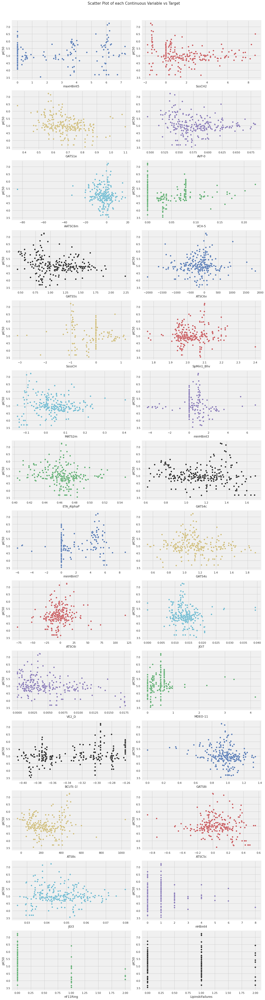

Number of All Scatter Plots = 406


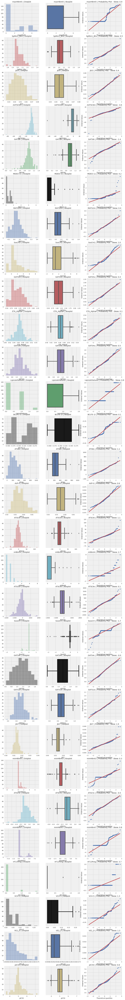

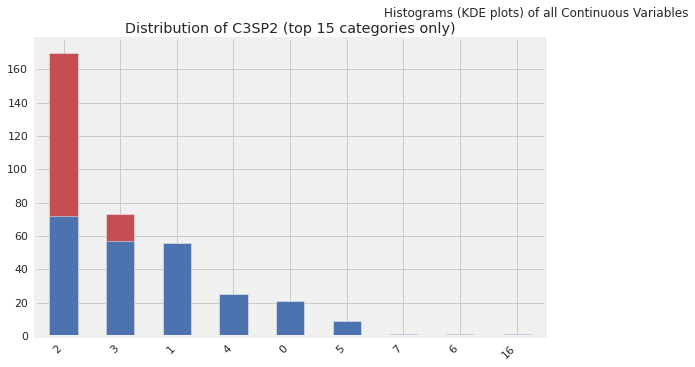

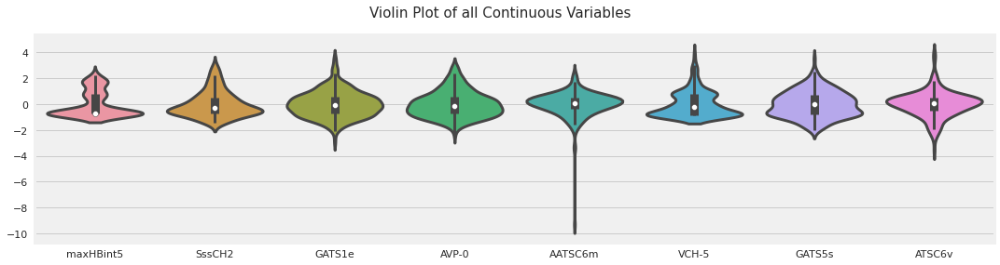

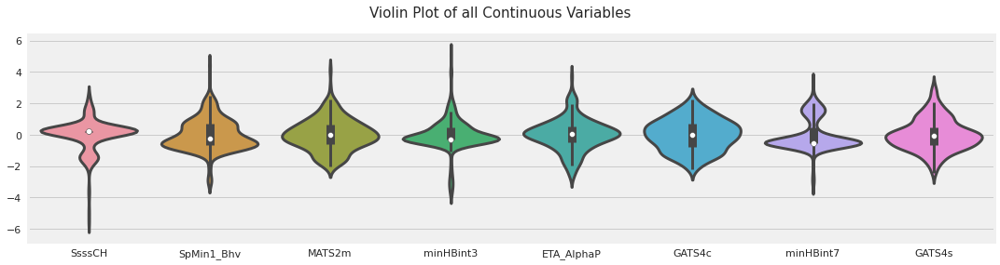

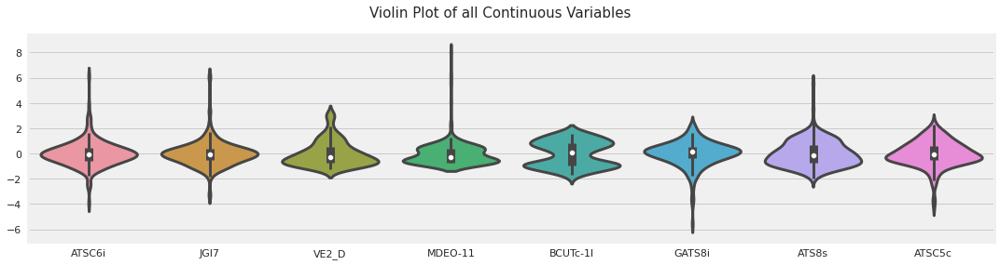

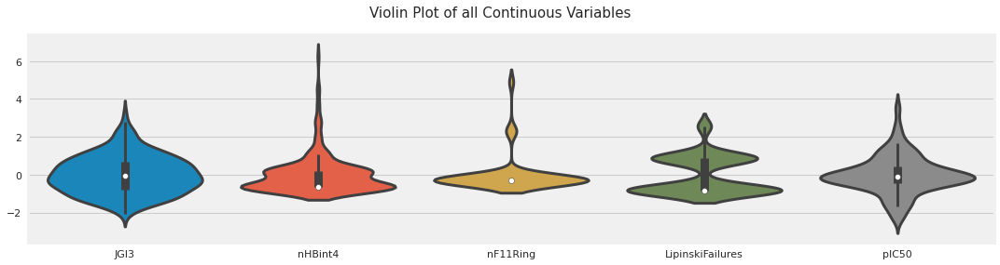

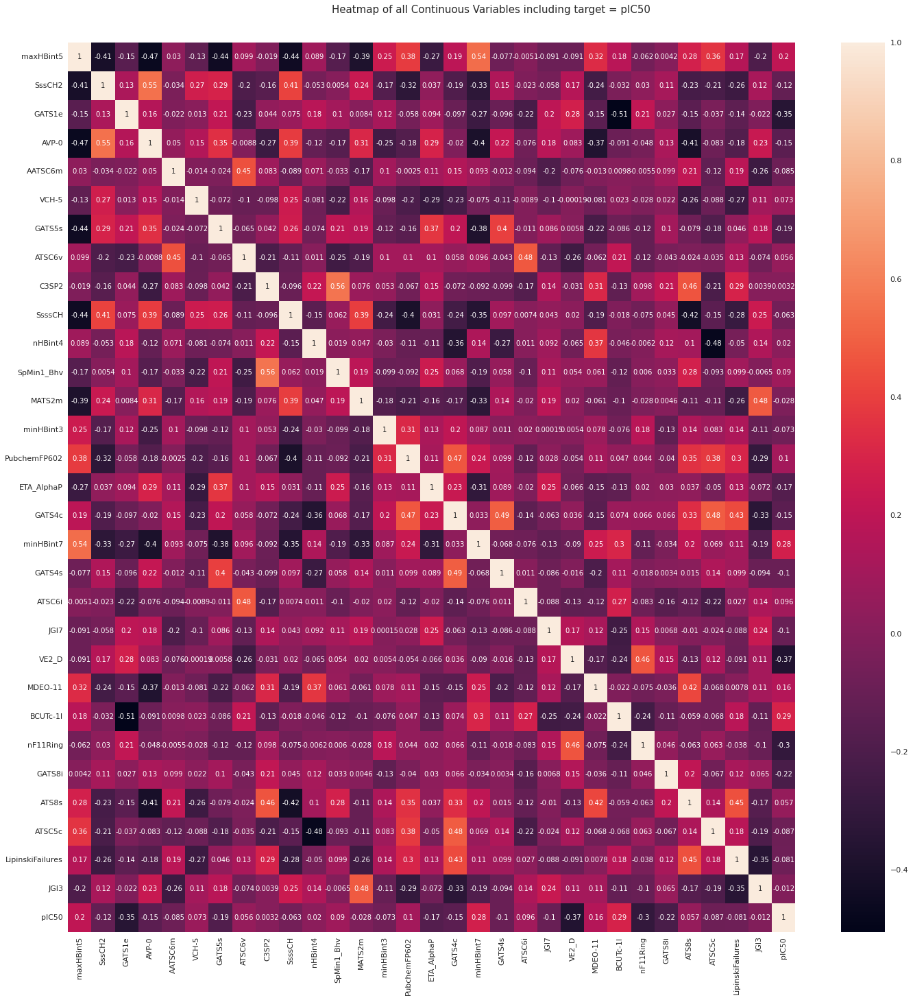

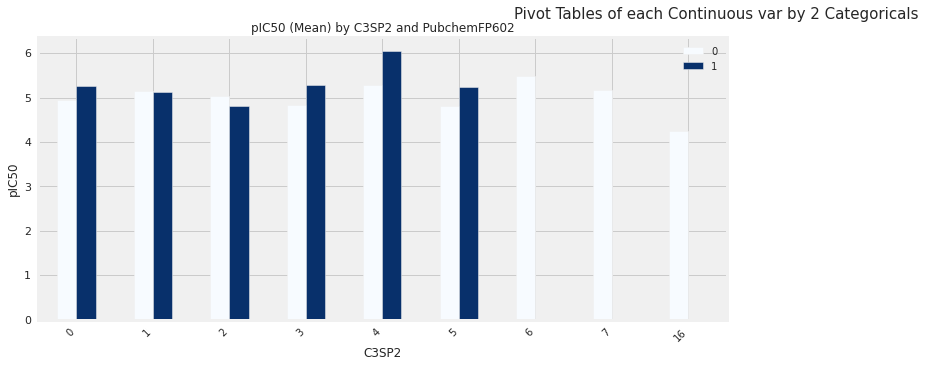

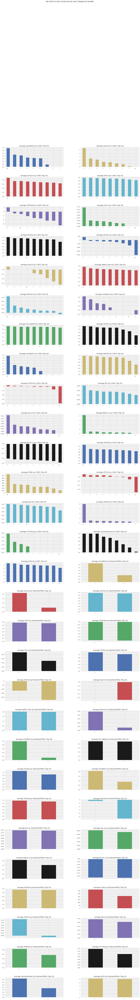

All Plots done
Time to run AutoViz = 196 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [ ]:
#@title Default title text
sep = ''
target = 'pIC50'
dft = AV.AutoViz('', sep, target, df7)

# Model Compairism

## Compaire Algorithms: Baseline

In [ ]:
# Test options and evaluation metric
num_folds = 10
seed = 7
scoring1 = 'neg_mean_squared_error'
scoring2 = 'neg_mean_squared_error'
scoring3 = 'r2'

In [ ]:
# Spot-Check Algorithms
models = []
#models.append(('LR', LinearRegression())) 
#models.append(('LASSO', Lasso()))
#models.append(('EN', ElasticNet())) 
models.append(('KNN', KNeighborsRegressor())) 
models.append(('CART', DecisionTreeRegressor()))
models.append(('AB',AdaBoostRegressor()))
models.append(('GBM',GradientBoostingRegressor()))
models.append(('RF',RandomForestRegressor()))
models.append(('ET',ExtraTreesRegressor()))
models.append(('SVR', SVR()))

In [ ]:
# evaluate each model in turn
results1 = []
results2 = []
results3 = []
names = []
for name, model in models:
  kfold = KFold(n_splits=num_folds, random_state=seed, shuffle = True)
  cv_results1 = cross_val_score(model, X_train, Y_train, cv=kfold, scoring=scoring1)
  cv_results2 = cross_val_score(model, X_train, Y_train, cv=kfold, scoring=scoring2)
  cv_results3 = cross_val_score(model, X_train, Y_train, cv=kfold, scoring=scoring3)
  results1.append(cv_results1)
  results2.append(cv_results2)
  results3.append(cv_results3)
  names.append(name)
  msg1 = "%s: %f (%f)" % (name, cv_results1.mean(), cv_results1.std())
  print("MAE :", msg1)

  msg2 = "%s: %f (%f)" % (name, cv_results2.mean(), cv_results2.std())
  print("MSE :", msg2)

  msg3 = "%s: %f (%f)" % (name, cv_results3.mean(), cv_results3.std())
 # print("r2 :", msg3)

MAE : KNN: -0.429416 (0.183408)
MSE : KNN: -0.429416 (0.183408)
MAE : CART: -0.541847 (0.157450)
MSE : CART: -0.615490 (0.242192)
MAE : AB: -0.279097 (0.144170)
MSE : AB: -0.326170 (0.148163)
MAE : GBM: -0.312243 (0.145585)
MSE : GBM: -0.311109 (0.143714)
MAE : RF: -0.291009 (0.129528)
MSE : RF: -0.295057 (0.118636)
MAE : ET: -0.281397 (0.135010)
MSE : ET: -0.278297 (0.124970)
MAE : SVR: -0.396946 (0.263296)
MSE : SVR: -0.396946 (0.263296)


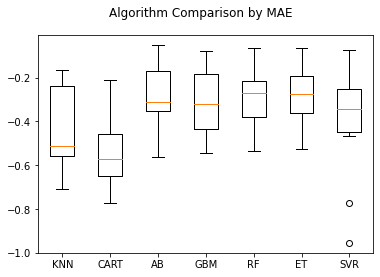

In [ ]:
# Compare Algorithms by MAE
fig = pyplot.figure() 
fig.suptitle('Algorithm Comparison by MAE') 
ax = fig.add_subplot(111) 
pyplot.boxplot(results1) 
ax.set_xticklabels(names) 
pyplot.show()

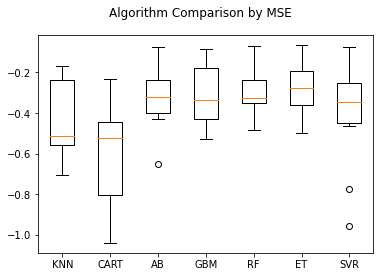

In [ ]:
# Compare Algorithms by MAE
fig = pyplot.figure() 
fig.suptitle('Algorithm Comparison by MSE') 
ax = fig.add_subplot(111) 
pyplot.boxplot(results2) 
ax.set_xticklabels(names) 
pyplot.show()

## Compaire Algorithms: Standardization


In [ ]:
# Standardize the dataset
pipelines = []
#pipelines.append(('ScaledLR', Pipeline([('Scaler', StandardScaler()),('LR',LinearRegression())])))
#pipelines.append(('ScaledLASSO', Pipeline([('Scaler', StandardScaler()),('LASSO',Lasso())])))
#pipelines.append(('ScaledEN', Pipeline([('Scaler', StandardScaler()),('EN', ElasticNet())])))
pipelines.append(('S_KNN', Pipeline([('Scaler', StandardScaler()),('KNN', KNeighborsRegressor())])))
pipelines.append(('S_CART', Pipeline([('Scaler', StandardScaler()),('CART', DecisionTreeRegressor())])))
pipelines.append(('S_SVR', Pipeline([('Scaler', StandardScaler()),('SVR', SVR())])))
pipelines.append(('S_AB', Pipeline([('Scaler', StandardScaler()),('AB',AdaBoostRegressor())])))
pipelines.append(('S_GBM', Pipeline([('Scaler', StandardScaler()),('GBM',GradientBoostingRegressor())])))
pipelines.append(('S_RF', Pipeline([('Scaler', StandardScaler()),('RF',RandomForestRegressor())])))
pipelines.append(('S_ET', Pipeline([('Scaler', StandardScaler()),('ET',ExtraTreesRegressor())])))

In [ ]:
# evaluate scaled
results1 = []
results2 = []
results3 = []
names = []
for name, model in pipelines:
  kfold = KFold(n_splits=num_folds, random_state=seed, shuffle = True)
  cv_results1 = cross_val_score(model, X_train, Y_train, cv=kfold, scoring=scoring1)
  cv_results2 = cross_val_score(model, X_train, Y_train, cv=kfold, scoring=scoring2)
  cv_results3 = cross_val_score(model, X_train, Y_train, cv=kfold, scoring=scoring3)
  results1.append(cv_results1)
  results2.append(cv_results2)
  results3.append(cv_results3)
  names.append(name)
  msg1 = "%s: %f (%f)" % (name, cv_results1.mean(), cv_results1.std())
  print("MAE :", msg1)

  msg2 = "%s: %f (%f)" % (name, cv_results2.mean(), cv_results2.std())
  print("MSE :", msg2)

  msg3 = "%s: %f (%f)" % (name, cv_results3.mean(), cv_results3.std())
  #print("r2 :", msg3)

MAE : S_KNN: -0.258819 (0.143767)
MSE : S_KNN: -0.258819 (0.143767)
MAE : S_CART: -0.609014 (0.241402)
MSE : S_CART: -0.639279 (0.261021)
MAE : S_SVR: -0.278873 (0.142689)
MSE : S_SVR: -0.278873 (0.142689)
MAE : S_AB: -0.294157 (0.149492)
MSE : S_AB: -0.326846 (0.159359)
MAE : S_GBM: -0.303289 (0.144707)
MSE : S_GBM: -0.316077 (0.140993)
MAE : S_RF: -0.301234 (0.135087)
MSE : S_RF: -0.292886 (0.116683)
MAE : S_ET: -0.281076 (0.132913)
MSE : S_ET: -0.274677 (0.119462)


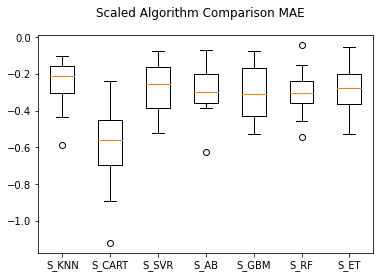

In [ ]:
# Compare Algorithms
fig = pyplot.figure()
fig.suptitle('Scaled Algorithm Comparison MAE') 
ax = fig.add_subplot(111) 
pyplot.boxplot(results1) 
ax.set_xticklabels(names)
pyplot.show()

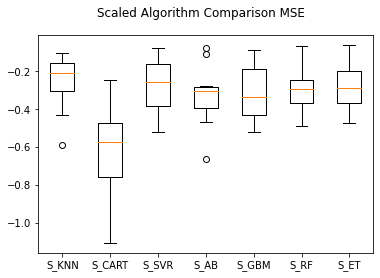

In [ ]:
# Compare Algorithms
fig = pyplot.figure()
fig.suptitle('Scaled Algorithm Comparison MSE') 
ax = fig.add_subplot(111) 
pyplot.boxplot(results2) 
ax.set_xticklabels(names)
pyplot.show()

# Finalize Model

In [ ]:
# prepare the model SVR
scaler = StandardScaler().fit(X_train)
rescaledX = scaler.transform(X_train)
#model_svr = GradientBoostingRegressor(random_state=seed, n_estimators=400)
model_svr = SVR()
model_svr.fit(rescaledX , Y_train)
scoring = 'neg_mean_squared_error'
results = cross_val_score(model, X, Y, cv=kfold, scoring=scoring) 
print("MSE of SVR:",results.mean())

MSE of SVR: -0.27495432293004984


In [ ]:
# transform the validation dataset
rescaledValidationX = scaler.transform(X_validation)
predictions = model_svr.predict(rescaledValidationX)
print("MSE on Validation set:",mean_squared_error(Y_validation, predictions))

MSE on Validation set: 0.23355861780299977


In [ ]:
# Use the forest's predict method on the test data
predictions = model_svr.predict(X_validation)

# Calculate the absolute errors
errors = abs(predictions - Y_validation)

# Print out the mean absolute error (mae)
#print('Mean Absolute Error:', round(np.mean(errors), 2), 'pIC50 value')


# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / Y_validation)

# Calculate and display accuracy
accuracy = 100 - np.mean(mape)


# Print out the mean absolute error (mae)
#print('Mean Absolute Error of SVR:', round(np.mean(errors), 2), 'pIC50 value')

print('Accuracy of SVR:', round(accuracy, 2), '%.')

Mean Absolute Error of SVR: 0.41 pIC50 value
Accuracy of SVR: 91.66 %.


/usr/local/lib/python3.7/dist-packages/sklearn/base.py:444: UserWarning: X has feature names, but SVR was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


# Save SVR

In [ ]:
from pickle import dump
from pickle import load
filename = 'Model_svr.sav' 
dump(model_svr, open(filename, 'wb'))